In [40]:
import os
import re
import sys
from os import listdir
from os.path import isfile, join
from pathlib import Path

import cv2 as cv
import h5py
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import skimage
from scipy import signal
from skimage import exposure, io
from skimage.util import img_as_ubyte
from tqdm.notebook import tqdm, trange
import scanpy as sc
import anndata as ad

In [35]:
p_dir = (Path().cwd().parents[0]).absolute()
data_dir = p_dir / "data"
figure_dir = p_dir / "figures"

In [36]:
%load_ext autoreload
%autoreload 2

module_path = str(p_dir / "src")

if module_path not in sys.path:
    sys.path.append(module_path)

import utils as my_utils

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Import tof-sims data

In [4]:
import matplotlib.gridspec as gridspec
from skimage import morphology
from skimage.transform import resize

h5_data_dir = p_dir / "data" / "h5"


def get_imgs(experiment, name):
    with h5py.File(h5_data_dir / f"{experiment}.hdf5", "r") as f:
        imgs = f[name][:]
        labels = list(f[name].attrs["labels"])
    return imgs, labels


def get_imgs_index(imgs, index_list):

    imgs_subset = imgs[index_list, :, :]
    img_combined = np.sum(imgs_subset, axis=0)
    return img_combined


def get_mass(file):
    labels = ["total", "rest"]
    with open(file) as infile:
        next(infile)
        for line in infile:
            mass = float(line.split("\t")[1])
            mass = np.round(mass, 1)
            labels.append(mass)
    return labels

In [5]:
masses = get_mass(data_dir / "metadata" / "peak.TXT")

In [6]:
experiment = "organoid"

ts_data_dir = p_dir / "data" / "tof-sims" / experiment
datasets = listdir(ts_data_dir)
datasets = [dataset for dataset in datasets if "auto" not in dataset]

In [7]:
top_similar = [
    32,
    18,
    3,
    97,
    88,
    33,
    34,
    7,
    77,
    44,
    79,
    59,
    146,
    81,
    109,
    31,
    117,
    60,
    111,
    143,
    115,
    105,
    167,
    142,
]

In [8]:
imgs_nuclei = []
imgs_all = []

for dataset in datasets:
    # Read images and get PO3 channel
    print(dataset)
    imgs, labels = get_imgs(experiment, dataset)

    # ---- Get Po3 channel for nuclei
    img_po3 = get_imgs_index(imgs, [32])
    p2, p98 = np.percentile(img_po3, (1, 100))
    img_po3 = exposure.rescale_intensity(
        img_po3, in_range=(p2, p98), out_range=(0, 255)
    )
    imgs_nuclei.append(img_po3)

    # ---- Get all channel for nuclei
    img_po3 = get_imgs_index(imgs, top_similar)
    p2, p98 = np.percentile(img_po3, (1, 100))
    img_po3 = exposure.rescale_intensity(
        img_po3, in_range=(p2, p98), out_range=(0, 255)
    )
    imgs_all.append(img_po3)

Sample_1
Sample_2
Sample_3
Sample_4
Sample_5


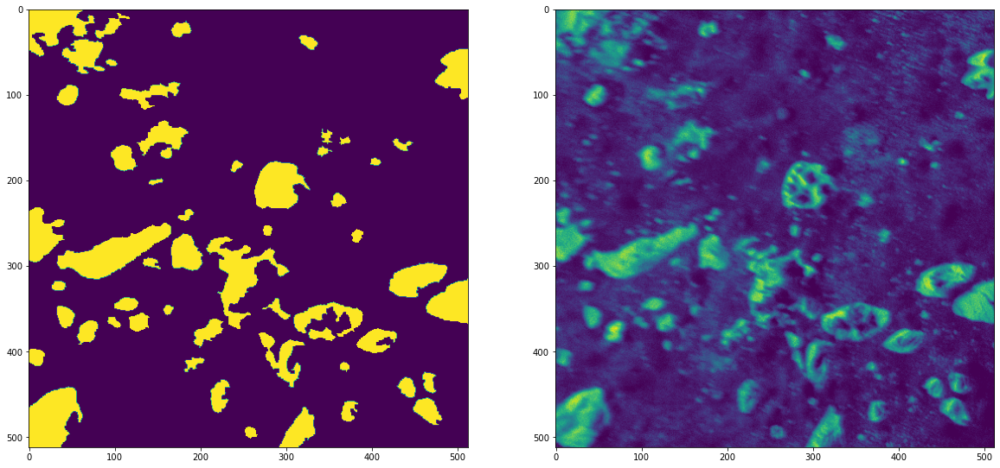

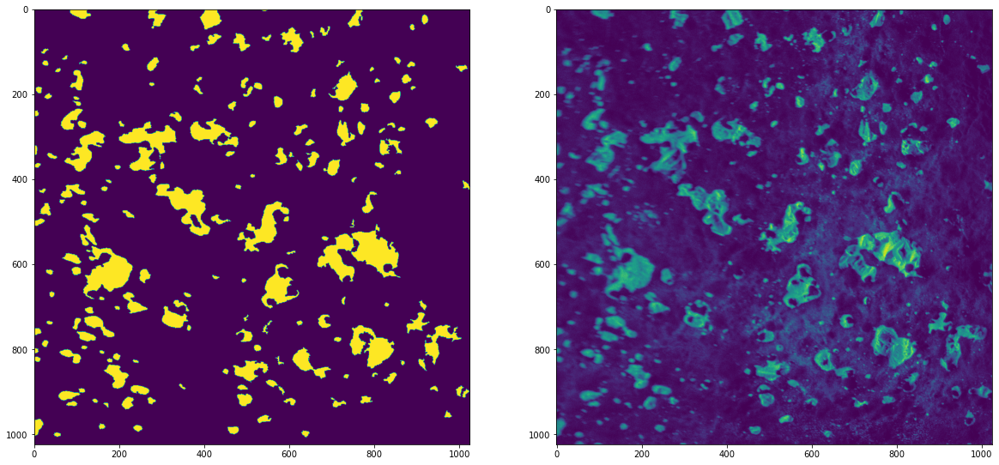

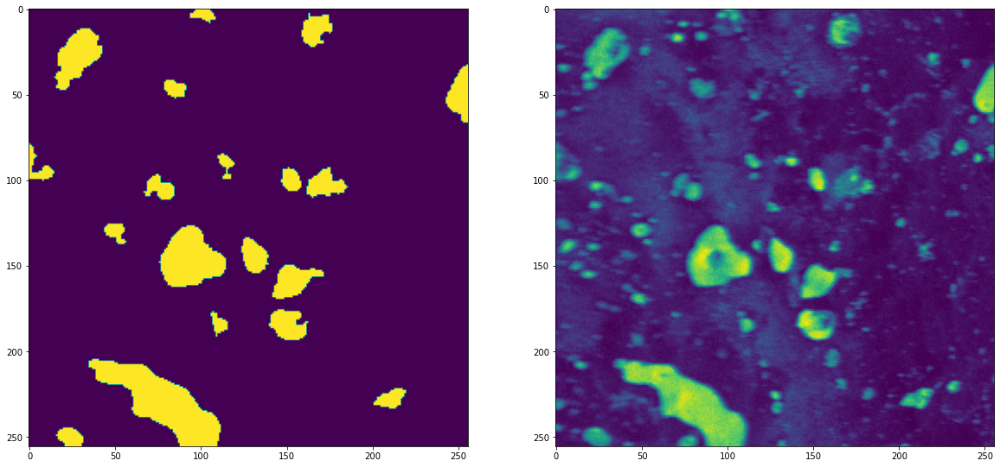

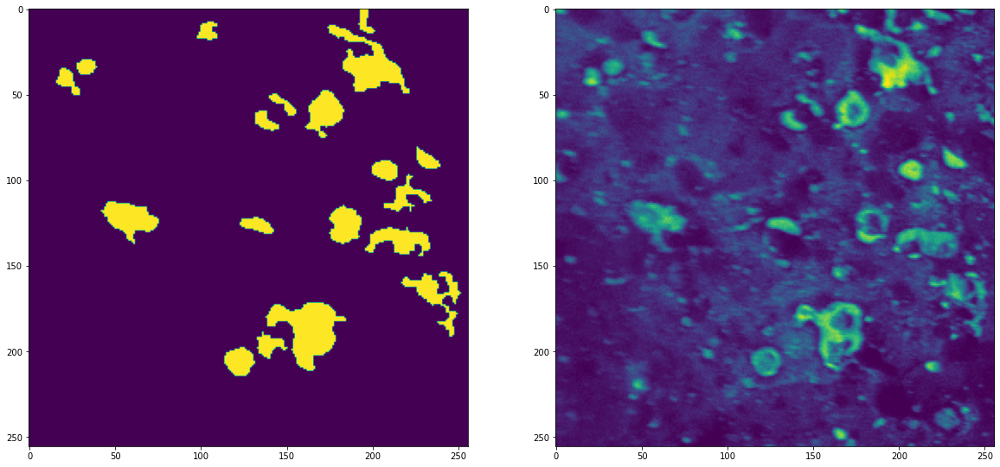

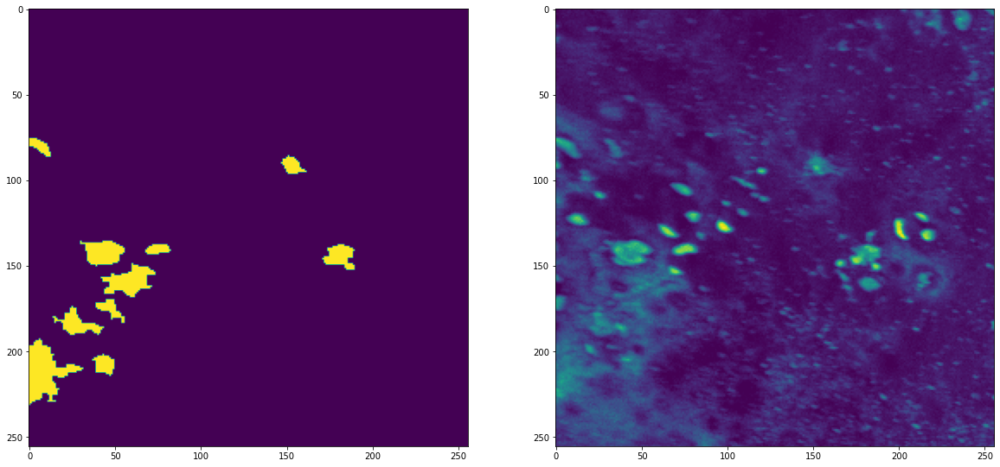

In [9]:
binaries = []
for img in imgs_all:
    fit, ax = plt.subplots(1, 2, figsize=(20, 10))
    binary = img > 80
    binary = morphology.closing(binary, morphology.square(3))
    binary = morphology.remove_small_holes(binary, area_threshold=300)
    binary = morphology.remove_small_objects(binary, min_size=70)
    binaries.append(binary)

    ax[1].imshow(img)
    ax[0].imshow(binary)
    plt.show()

# M/z inside of cell

In [83]:
from skimage.measure import regionprops_table
from skimage import measure
from sklearn.preprocessing import MinMaxScaler

def plot_top_similar(top_similar, imgs, masses):
    fig, axs = plt.subplots(4, 6, figsize=(20, 15))
    axs = axs.flatten()
    for i, ax in enumerate(axs):
        idx = top_similar[i]
        ax.imshow(imgs[idx], cmap="hot")
        ax.set_title(f"m/z: {masses[idx]}", fontsize=30)
        ax.axis("off")
    fig.tight_layout()
    plt.subplots_adjust(wspace=0.01, hspace=0.05)
    plt.show()


def get_region_props(img, mask, marker, prop):
    """
    Get regionprops from masked region
    """
    props = regionprops_table(mask, img, properties=prop)

    df_marker = pd.DataFrame(props)
    df_marker["Marker"] = marker
    df_marker["Id"] = regionprops_table(mask, properties=["label"])["label"]

    return df_marker


def extract_prop_ts(imgs, labels, mask):
    appended_data_intensity = []

    for i, img in enumerate(imgs):
        p2, p98 = np.percentile(img, (0, 100))
        img = exposure.rescale_intensity(img, in_range=(p2, p98), out_range=(0, 255))
        img = img.astype(np.uint8)
        df_marker = get_region_props(img, mask, labels[i], ["mean_intensity"])
        appended_data_intensity.append(df_marker)

        if i == 0:
            df_prop_morph = get_region_props(img, mask, labels[i], ["area"])

    df_prop_intensity = pd.concat(appended_data_intensity, ignore_index=True)
    df_prop_intensity = df_prop_intensity.sort_values(by=["Id"]).reset_index(drop=True)

    df_prop_morph = df_prop_morph.drop(["Marker"], axis=1)

    x_scaled = MinMaxScaler().fit_transform(df_prop_intensity[["mean_intensity"]])
    df_prop_intensity["mean_intensity"] = x_scaled
    
    return df_prop_intensity, df_prop_morph

Sample_1


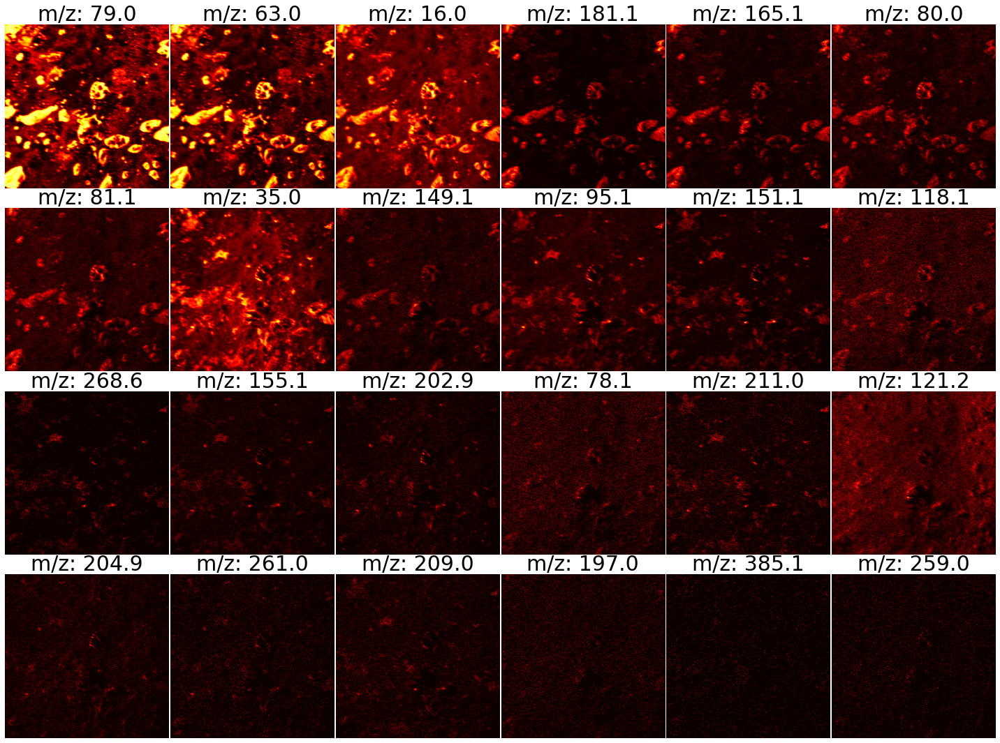

Sample_2


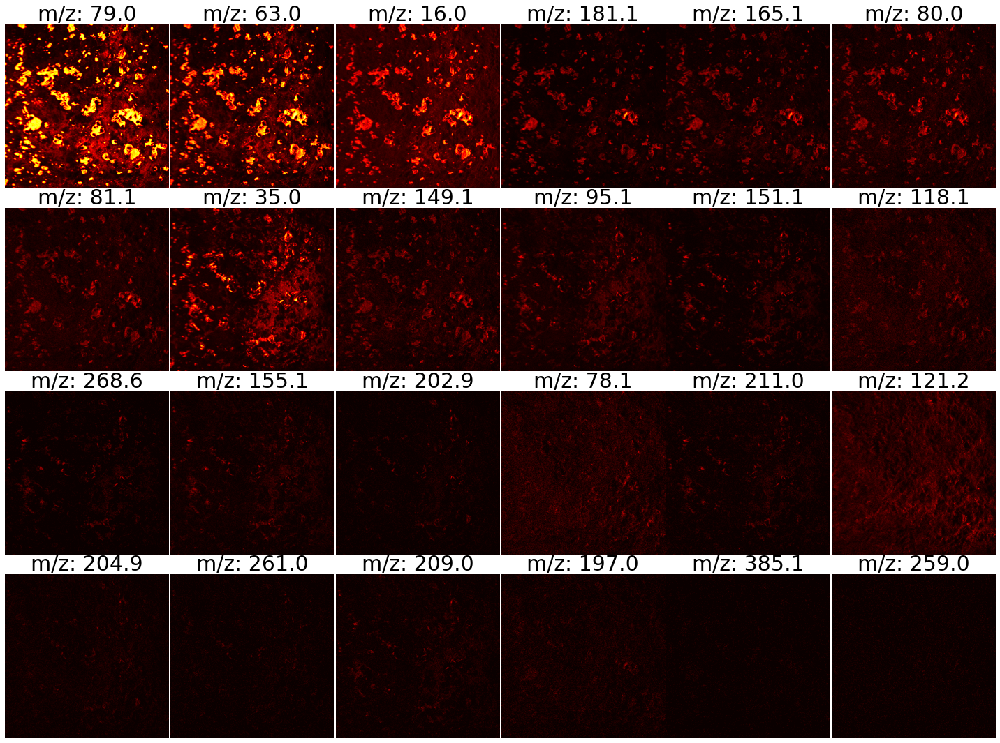

Sample_3


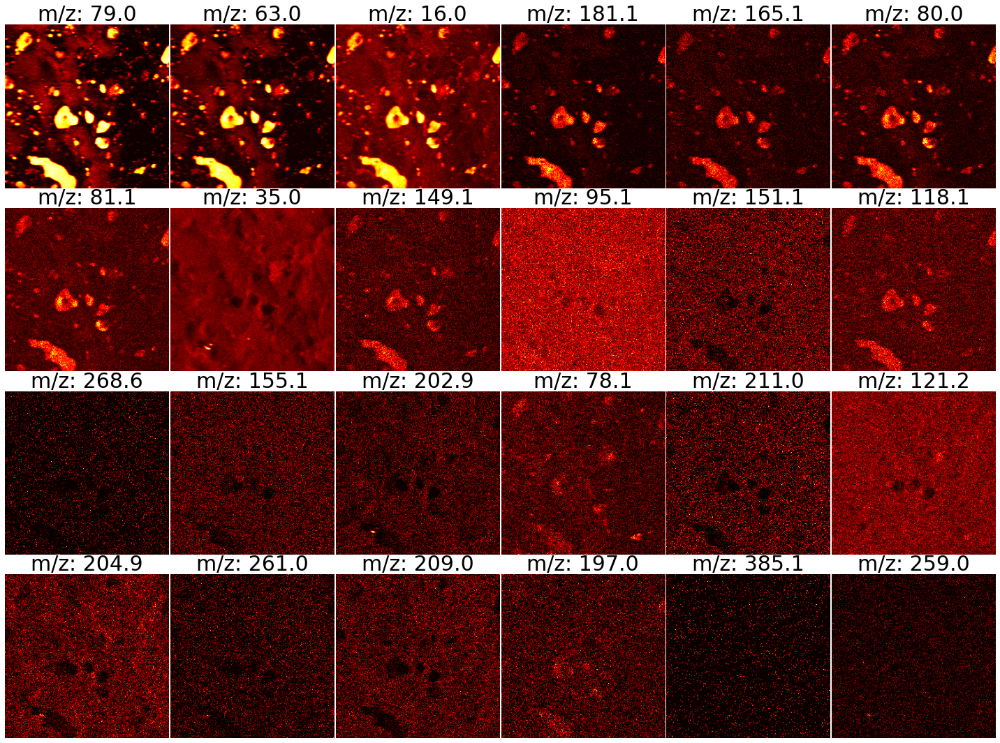

Sample_4


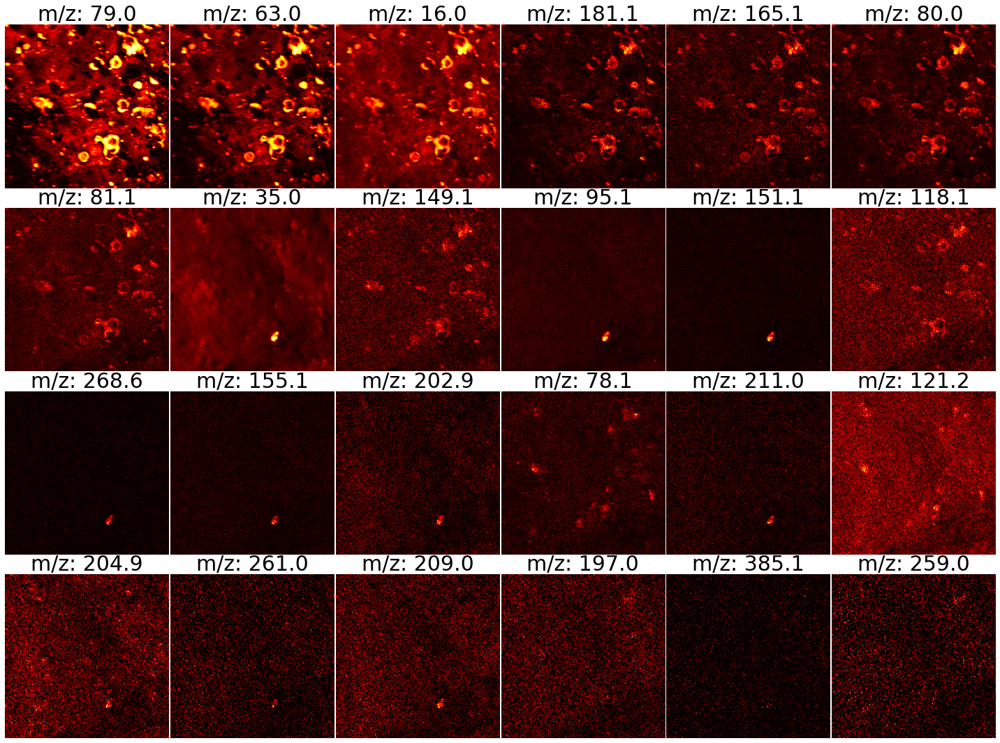

Sample_5


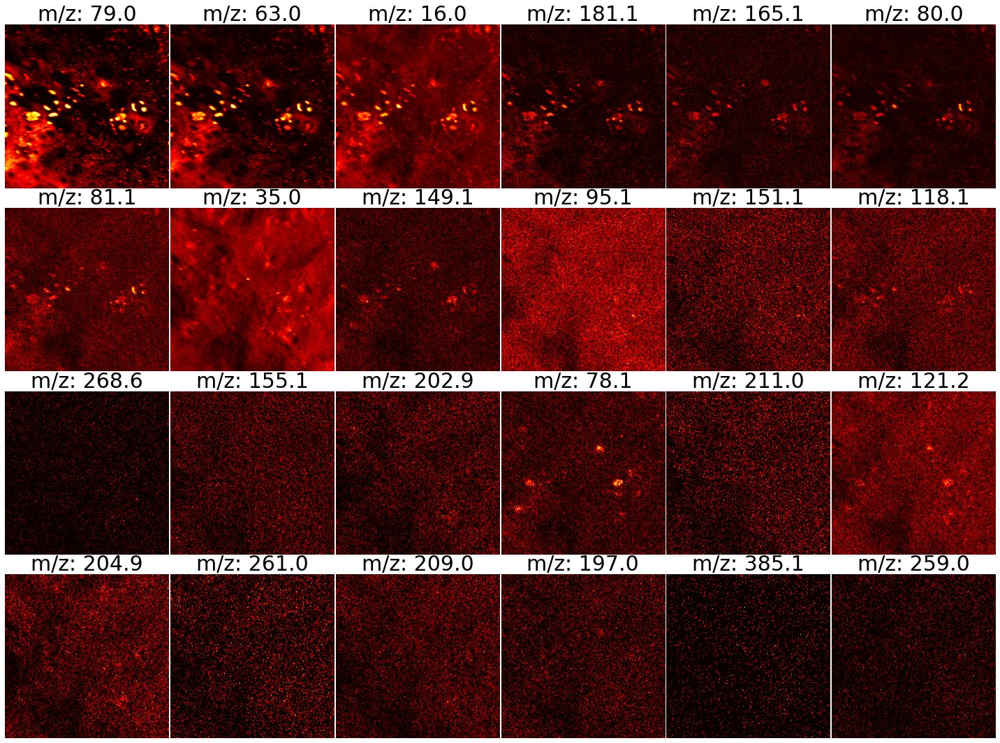

In [17]:
for dataset in datasets:
    # Read images and get PO3 channel
    print(dataset)
    imgs, labels = get_imgs(experiment, dataset)
    plot_top_similar(
        top_similar, imgs, masses,
    )

In [53]:
masses = [
    50,
    190,
    191,
    193,
    194,
    196,
    198,
    200,
    201,
    202,
    203,
    55,
    204,
    205,
    206,
    207,
    208,
    209,
    210,
    212,
    214,
    216,
    56,
    217,
    220,
    221,
    222,
    223,
    224,
    225,
    226,
    229,
    232,
    57,
    236,
    238,
    240,
    243,
    246,
    248,
    249,
    250,
    252,
    253,
    58,
    254,
    256,
    259,
    261,
    263,
    265,
    267,
    269,
    273,
    275,
    59,
    276,
    279,
    282,
    289,
    301,
    307,
    308,
    310,
    318,
    60,
    328,
    332,
    339,
    344,
    353,
    359,
    369,
    380,
    385,
    397,
    61,
    412,
    424,
    431,
    436,
    448,
    457,
    468,
    474,
    479,
    498,
    63,
    501,
    510,
    514,
    518,
    520,
    529,
    544,
    552,
    570,
    586,
    64,
    593,
    610,
    1,
    66,
    67,
    68,
    69,
    70,
    71,
    72,
    73,
    74,
    75,
    16,
    76,
    78,
    79,
    80,
    81,
    82,
    83,
    84,
    85,
    86,
    17,
    87,
    88,
    91,
    93,
    95,
    96,
    97,
    98,
    100,
    102,
    30,
    104,
    105,
    107,
    109,
    111,
    112,
    115,
    116,
    117,
    118,
    34,
    121,
    122,
    124,
    125,
    127,
    128,
    131,
    133,
    134,
    138,
    35,
    140,
    141,
    143,
    144,
    145,
    146,
    148,
    149,
    150,
    151,
    42,
    153,
    155,
    156,
    158,
    159,
    161,
    162,
    164,
    165,
    166,
    44,
    167,
    168,
    169,
    170,
    171,
    173,
    179,
    182,
    184,
    185,
]
masses.sort()
masses = ["Total", "Rest"] + masses

In [172]:
adatas = []
conditions = ['Control', 'Control', 'Treated', 'Treated']

for i, binary in enumerate(binaries[:-1]):
    imgs, labels = get_imgs(experiment, datasets[i])
    mask = measure.label(binary)

    df_prop_intensity, df_morph = extract_prop_ts(imgs, masses, mask)
    df_morph = df_morph.set_index('Id')
    df_prop_intensity = pd.pivot_table(
        df_prop_intensity, values="mean_intensity", index="Id", columns="Marker"
    )

    df_prop_intensity.drop(["Total", "Rest"], axis=1, inplace=True)
    # df_prop_intensity = df_prop_intensity.multiply(
    #     df_morph["area"], axis=0
    # )
    adata = sc.AnnData(df_prop_intensity.values)
    adata.var_names = df_prop_intensity.columns.tolist()
    adata.obs["Cell"] = df_prop_intensity.index.tolist()
    adata.obs["Dataset"] = datasets[i]
    adata.obs['Condition'] = conditions[i]
    # sc.pp.log1p(adata)
    # sc.pp.scale(adata, max_value=4)
    adatas.append(adata)

C:\Users\thu71\Anaconda3\envs\new_codex\lib\site-packages\anndata\_core\anndata.py:898: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    [1, 16, 17, 30, 34]

    Inferred to be: integer

  names = self._prep_dim_index(names, "var")
C:\Users\thu71\Anaconda3\envs\new_codex\lib\site-packages\anndata\_core\anndata.py:898: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    [1, 16, 17, 30, 34]

    Inferred to be: integer

  names = self._prep_dim_index(names, "var")
C:\Users\thu71\Anaconda3\envs\new_codex\lib\site-packages\anndata\_core\anndata.py:898: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    [1, 16, 17, 30, 34]

    Inferred to be: integer

  names = self._prep_dim_index(names, "var")
C:\Users\thu71\Anaconda3\envs\new_codex\lib\site-packages\anndata\_core\anndata.py:898: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    [1, 16, 17, 30, 34]

In [173]:
adata = ad.concat(adatas, join="inner")
SIMS_masses = adata.var_names.tolist()

C:\Users\thu71\Anaconda3\envs\new_codex\lib\site-packages\anndata\_core\anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [174]:
ac_mass = [44, 70, 73, 56, 84, 42, 82, 86, 61, 74, 72]
ac_index = [SIMS_masses.index(str(i)) for i in ac_mass]
ac_names = [
    "Alanine",
    "Arginine",
    "Asparagine",
    "Glutamine",
    "Glutamine acid",
    "Glycine",
    "Histidine",
    "Leucine/Isoleucine",
    "Methionine",
    "Threonine",
    "Valine",
]

In [175]:
df_lipid = pd.read_csv(data_dir / "metadata" / "lipid.csv")
df_lipid = df_lipid[["Mass", "Name"]]

lipid_mass = df_lipid.Mass.values.tolist()
lipid_names = df_lipid.Name.values.tolist()
lipid_index = [SIMS_masses.index(str(i)) for i in lipid_mass]

         Falling back to preprocessing with `sc.pp.pca` and default params.


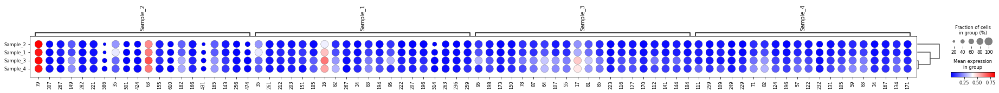

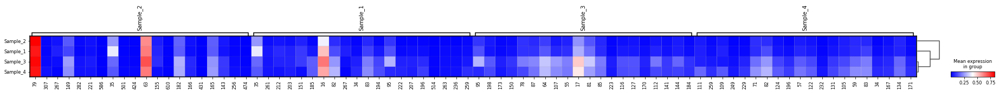

In [189]:
sc.tl.rank_genes_groups(adata, groupby='Dataset', method="wilcoxon")
sc.pl.rank_genes_groups_dotplot(adata, n_genes=20, cmap="bwr")
sc.pl.rank_genes_groups_matrixplot(adata, n_genes=20, cmap="bwr")

In [203]:
adata_subset = adata[:, lipid_index]

Trying to set attribute `._uns` of view, copying.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


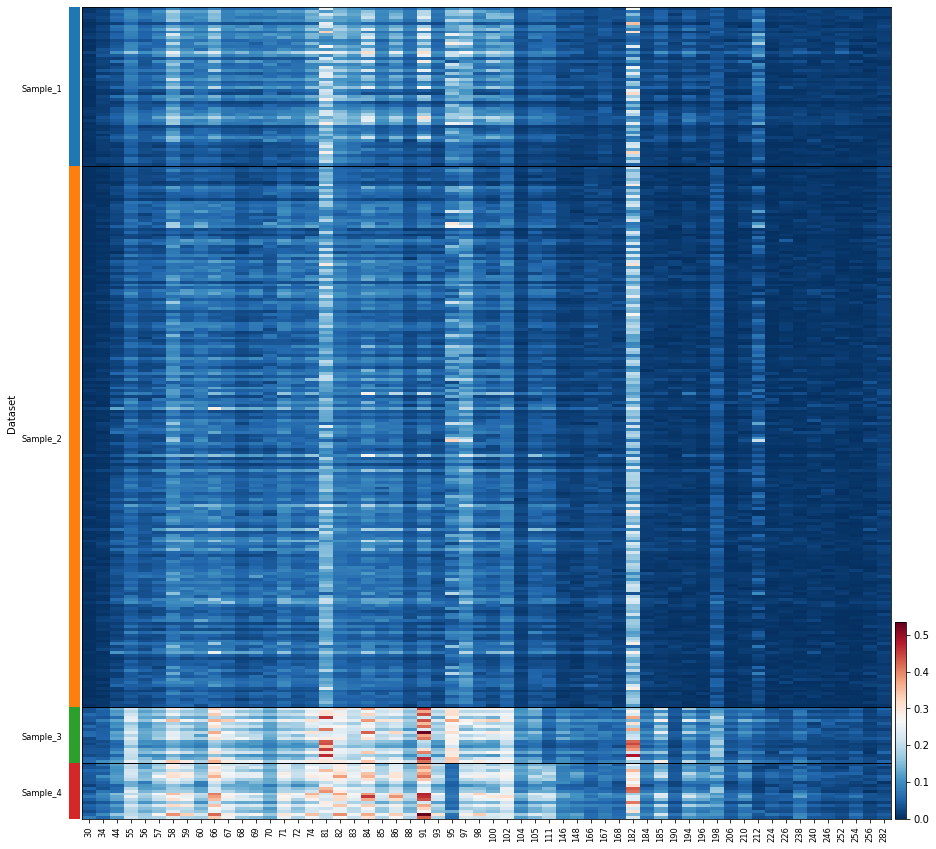

In [204]:
sc.pl.heatmap(
    adata_subset,
    adata_subset.var_names.tolist(),
    "Dataset",
    swap_axes=False,
    dendrogram=False,
    cmap="RdBu_r",
    figsize=(15, 15),
    show_gene_labels=True
)

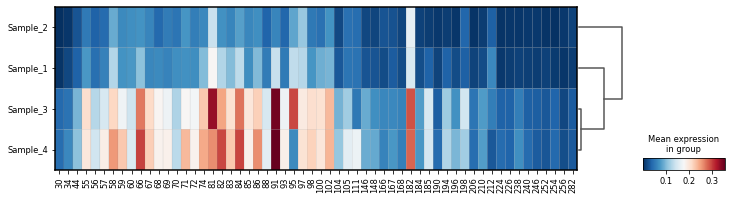

In [205]:
sc.pl.matrixplot(
    adata_subset,
    adata_subset.var_names.tolist(),
    "Dataset",
    swap_axes=False,
    dendrogram=True,
    cmap="RdBu_r",
    figsize=(12, 3),
)

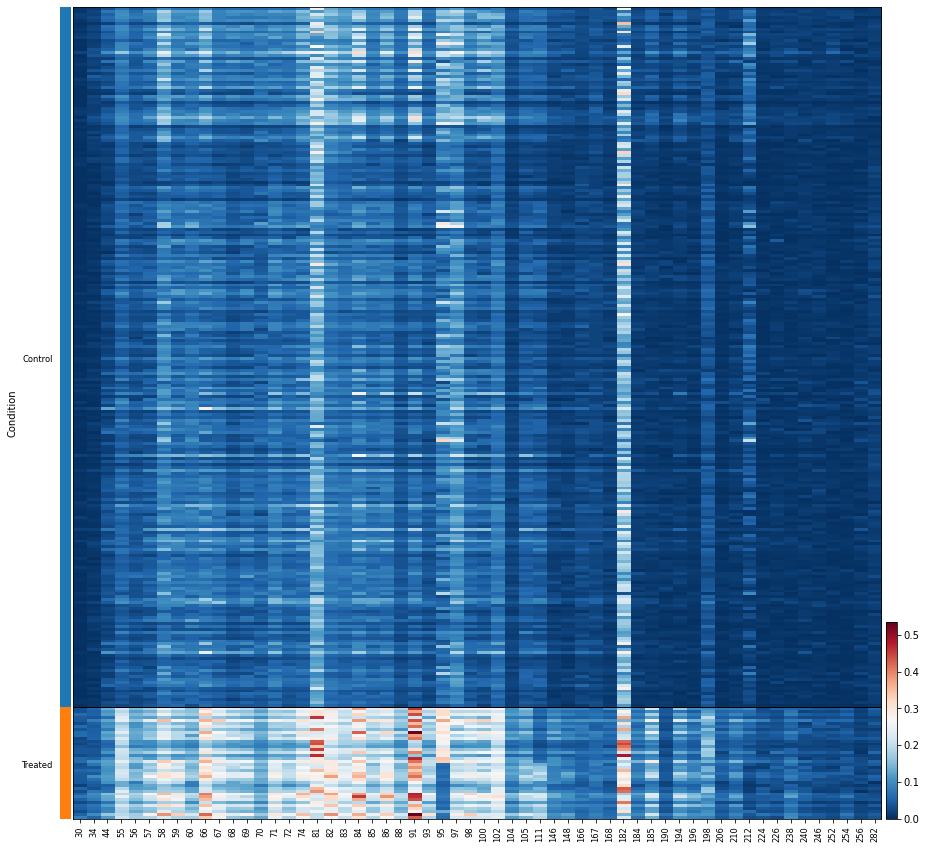

In [206]:
sc.pl.heatmap(
    adata_subset,
    adata_subset.var_names.tolist(),
    "Condition",
    swap_axes=False,
    dendrogram=False,
    cmap="RdBu_r",
    figsize=(15, 15),
    show_gene_labels=True
)

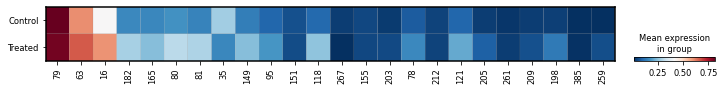

In [214]:
sc.pl.matrixplot(
    adata_subset,
    adata_subset.var_names.tolist(),
    "Condition",
    swap_axes=False,
    dendrogram=True,
    cmap="RdBu_r",
    figsize=(12, 1),
)

In [215]:
index = [i-2 for i in top_similar]
adata_subset = adata[:, index]

Trying to set attribute `._uns` of view, copying.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


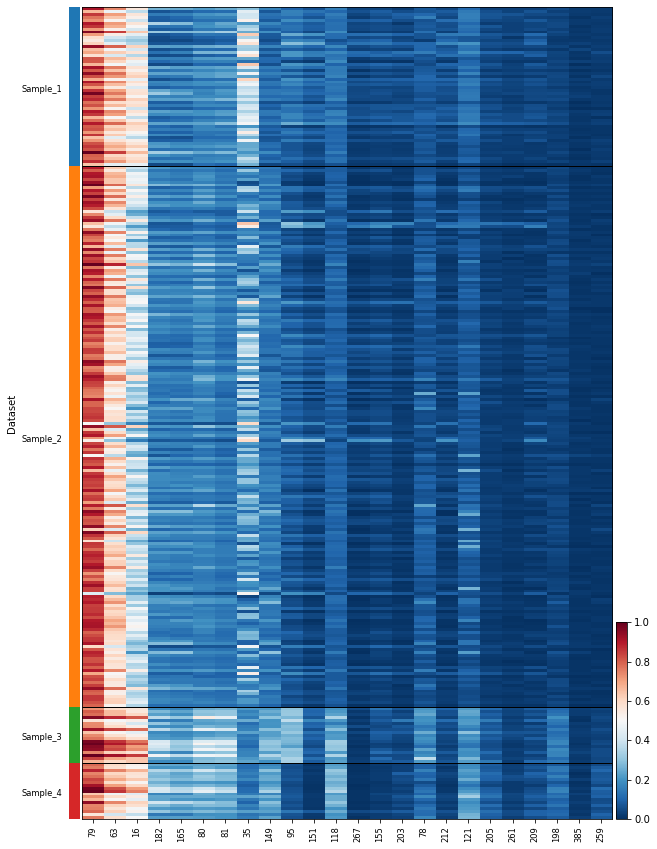

In [216]:
sc.pl.heatmap(
    adata_subset,
    adata_subset.var_names.tolist(),
    "Dataset",
    swap_axes=False,
    dendrogram=False,
    cmap="RdBu_r",
    figsize=(10, 15),
    show_gene_labels=True
)

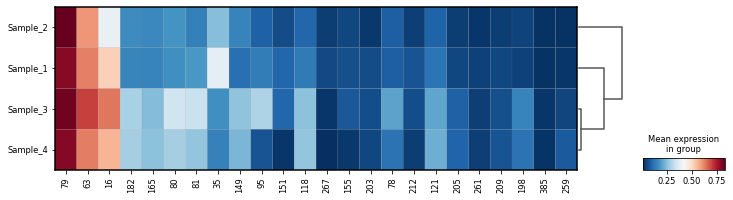

In [217]:
sc.pl.matrixplot(
    adata_subset,
    adata_subset.var_names.tolist(),
    "Dataset",
    swap_axes=False,
    dendrogram=True,
    cmap="RdBu_r",
    figsize=(12, 3),
)

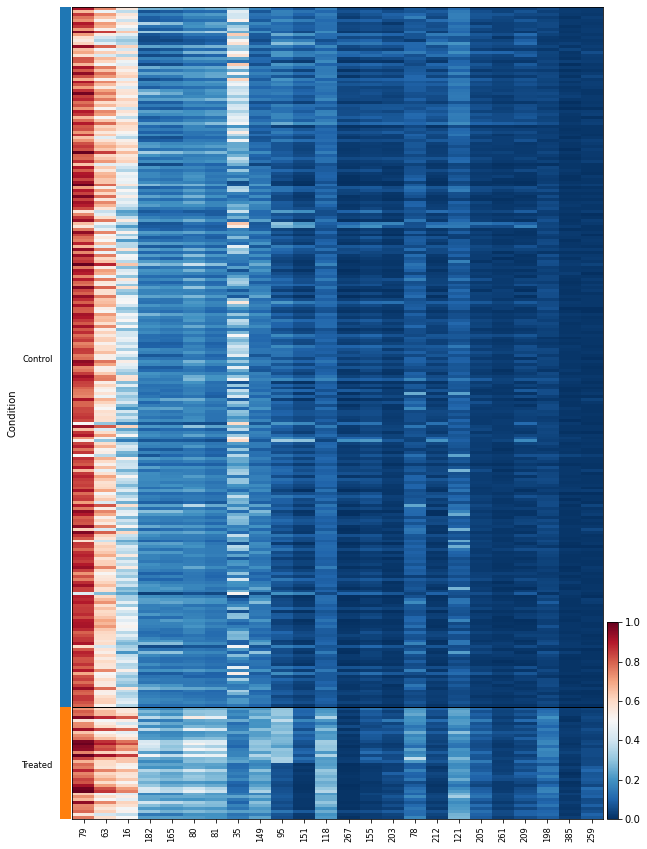

In [218]:
sc.pl.heatmap(
    adata_subset,
    adata_subset.var_names.tolist(),
    "Condition",
    swap_axes=False,
    dendrogram=False,
    cmap="RdBu_r",
    figsize=(10, 15),
    show_gene_labels=True
)

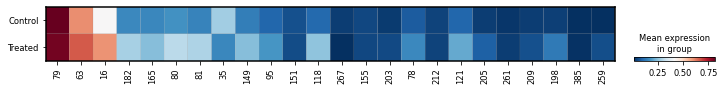

In [220]:
sc.pl.matrixplot(
    adata_subset,
    adata_subset.var_names.tolist(),
    "Condition",
    swap_axes=False,
    dendrogram=True,
    cmap="RdBu_r",
    figsize=(12, 1),
)

# Clustering

In [234]:
import scanorama
from matplotlib.pyplot import rc_context

In [235]:
adata_subset = adata[:, lipid_index]

In [236]:
alldata = {}
for batch in adata_subset.obs["Dataset"].unique():
    alldata[batch] = adata_subset[
        adata_subset.obs["Dataset"] == batch,
    ]

#convert to list of AnnData objects
adatas = list(alldata.values())

# run scanorama.integrate
adatas_cor = scanorama.correct_scanpy(adatas, return_dimred=True, return_dense=True)

# make into one matrix.
adata_integrated = ad.concat(adatas_cor)

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


Found 58 genes among all datasets
[[0.         0.83333333 0.94736842 0.63157895]
 [0.         0.         0.73684211 0.47368421]
 [0.         0.         0.         1.        ]
 [0.         0.         0.         0.        ]]
Processing datasets (2, 3)
Processing datasets (0, 2)
Processing datasets (0, 1)
Processing datasets (1, 2)
Processing datasets (0, 3)
Processing datasets (1, 3)


In [237]:
sc.pp.neighbors(adata_integrated, use_rep="X_scanorama")
sc.tl.umap(adata_integrated)

In [238]:
sc.tl.tsne(adata_integrated, use_rep="X_scanorama")

C:\Users\thu71\Anaconda3\envs\new_codex\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


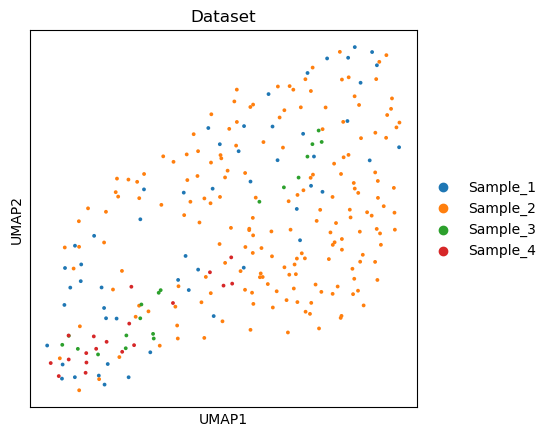

In [240]:

with rc_context({"figure.figsize": (5, 5), "figure.dpi": 100}):
    fig = sc.pl.umap(adata_integrated, color=["Dataset"], size=30)

In [242]:
sc.tl.leiden(adata_integrated, key_added="clusters")

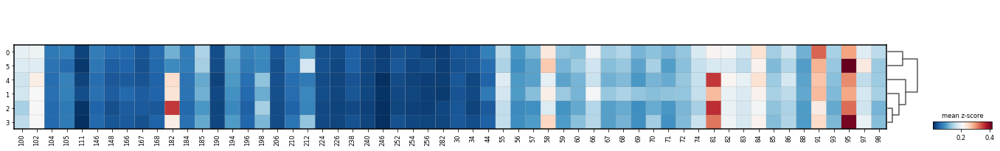

In [246]:
sc.pl.matrixplot(
    adata_integrated,
    adata_integrated.var_names.tolist(),
    "clusters",
    dendrogram=True,
    colorbar_title="mean z-score",
    cmap="RdBu_r",
)

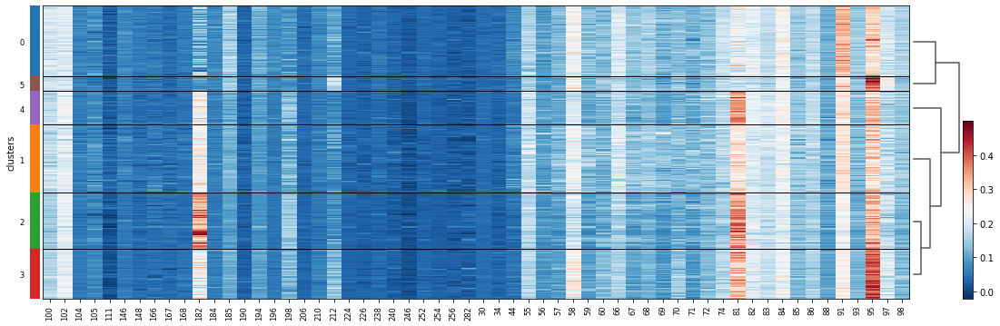

In [260]:
sc.pl.heatmap(
    adata_integrated,
    adata_integrated.var_names.tolist(),
    "clusters",
    dendrogram=True,
    cmap="RdBu_r",
    show_gene_labels=True
)

In [253]:
import matplotlib 

def create_clustered_cell(mask, label2cell, my_cmap, **kwargs):
    img = np.zeros((mask.shape[0], mask.shape[1], 3), dtype=np.uint8)

    for i, cells in tqdm(label2cell.items(), total=len(label2cell)):
        rows, cols = np.where(np.isin(mask, cells))
        img[rows, cols, :] = my_cmap[int(i)]

    return img

colors = adata_integrated.uns["clusters_colors"]
labels = np.unique(adata_integrated.obs.clusters.tolist())

colors_rgb = []
for color in colors:
    colors_rgb.append(matplotlib.colors.hex2color(color))
colors_rgb = np.array(colors_rgb) * 255
colors_rgb = colors_rgb.astype(np.uint8)

  0%|          | 0/6 [00:00<?, ?it/s]

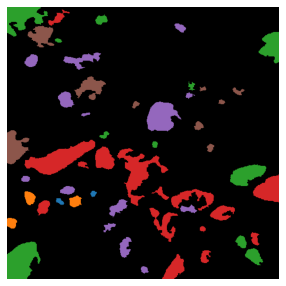

  0%|          | 0/6 [00:00<?, ?it/s]

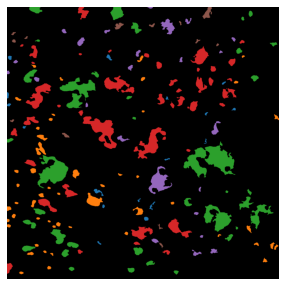

  0%|          | 0/6 [00:00<?, ?it/s]

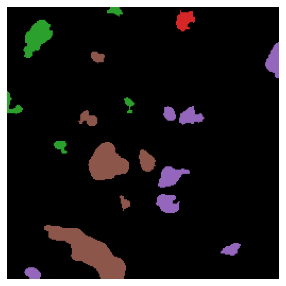

  0%|          | 0/6 [00:00<?, ?it/s]

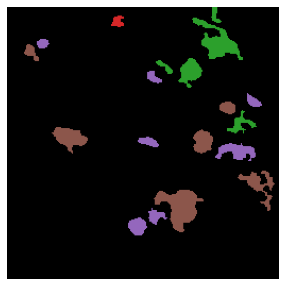

In [256]:
for i, dataset in enumerate(datasets[:-1]):
    adata_subset = adata_integrated[adata_integrated.obs.Dataset == dataset, :]
    mask = measure.label(binaries[i])

    # Get label2cell dict
    label2cell = {}
    for l in labels:
        cell_id = adata_integrated[adata_integrated.obs.clusters == l].obs.Cell.to_list()
        label2cell[l] = cell_id

    img = create_clustered_cell(mask, label2cell, colors_rgb)

    fig, ax = plt.subplots(figsize=(5, 5))
    ax.imshow(img)
    ax.axis("off")
    plt.show()